In [1]:
import os
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"]="3"

import numpy as np
import matplotlib.pyplot as plt
from ce_utils import load_data, one_hot, test_batch_idxs, batch_flatten
from ce_utils import model_prob
from ce_model import binary_model, ensemble_model

/usr/local/lib/python3.5/dist-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/usr/local/lib/python3.5/dist-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/usr/local/lib/python3.5/dist-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/usr/local/lib/python3.5/dist-packages/tensorflow/python/framework/dtypes.py:519: FutureWarning: Passing (type, 1) or 

In [2]:
# neg_img, neg_name = load_data('test', 'negative')
redspot_img, redspot_name = load_data('test', 'hemorrhagic', 'red_spot')
angio_img, angio_name = load_data('test', 'hemorrhagic', 'angioectasia')
active_img, active_name = load_data('test', 'hemorrhagic', 'active_bleeding')
ero_img, ero_name = load_data('test', 'depressed', 'erosion')
ulcer_img, ulcer_name = load_data('test', 'depressed', 'ulcer')
str_img, str_name = load_data('test', 'depressed', 'stricture')

# neg_label = one_hot(neg_img, 0)
redspot_label = one_hot(redspot_img, 1)
angio_label = one_hot(angio_img, 1)
active_label = one_hot(active_img, 1)
ero_label = one_hot(ero_img, 1)
ulcer_label = one_hot(ulcer_img, 1)
str_label = one_hot(str_img, 1)

# print("negative:",neg_img.shape, neg_label.shape)


H_img = np.vstack([redspot_img, angio_img, active_img])
H_label = np.vstack([redspot_label, angio_label, active_label])

D_img = np.vstack([ero_img, ulcer_img, str_img])
D_label = np.vstack([ero_label, ulcer_label, str_label])

print("Hemorrhgic lesion:", H_img.shape, H_label.shape, '\n')
print("red spot:",redspot_img.shape, redspot_label.shape)
print("angioectasia:",angio_img.shape, angio_label.shape)
print("active_bleeding:",active_img.shape, active_label.shape)
print('')
print("Depressed lesion:", D_img.shape, D_label.shape, '\n')
print("erosion:",ero_img.shape, ero_label.shape)
print("ulcer:",ulcer_img.shape, ulcer_label.shape)
print("stricture:",str_img.shape, str_label.shape)

Hemorrhgic lesion: (2007, 512, 512, 3) (2007, 2) 

red spot: (1112, 512, 512, 3) (1112, 2)
angioectasia: (37, 512, 512, 3) (37, 2)
active_bleeding: (858, 512, 512, 3) (858, 2)

Depressed lesion: (3147, 512, 512, 3) (3147, 2) 

erosion: (1476, 512, 512, 3) (1476, 2)
ulcer: (1464, 512, 512, 3) (1464, 2)
stricture: (207, 512, 512, 3) (207, 2)


In [3]:
nh_path = './model/' + 'NH_1908312018_5750_val_acc_1.00_val_loss_0.001598'
nd_path = './model/' + 'ND_1908302155_7140_val_acc_1.00_val_loss_0.002939'
b_path = './model/' + 'NHD_1908242109_8570_val_acc_1.00_val_loss_0.011026'

NH_model = binary_model(nh_path)
ND_model = binary_model(nd_path)
E_model = ensemble_model(nh_path, nd_path)
B_model = binary_model(b_path)

W1225 00:17:14.897798 140297033193216 deprecation_wrapper.py:119] From /mnt/disk1/project/SMhospital/capsule/algorithm/ensemble/ce_model.py:108: The name tf.Session is deprecated. Please use tf.compat.v1.Session instead.

W1225 00:17:19.680363 140297033193216 deprecation_wrapper.py:119] From /mnt/disk1/project/SMhospital/capsule/algorithm/ensemble/ce_model.py:109: The name tf.train.import_meta_graph is deprecated. Please use tf.compat.v1.train.import_meta_graph instead.

W1225 00:17:20.183930 140297033193216 deprecation.py:323] From /usr/local/lib/python3.5/dist-packages/tensorflow/python/training/saver.py:1276: checkpoint_exists (from tensorflow.python.training.checkpoint_management) is deprecated and will be removed in a future version.
Instructions for updating:
Use standard file APIs to check for files with this prefix.


# Model Inference

In [4]:
print('Ensemble model\n')

# neg_nh_output, neg_nd_output = model_prob(E_model, neg_img)
H_nh_output, H_nd_output = model_prob(E_model, H_img, model_type = 'ensemble')
D_nh_output, D_nd_output = model_prob(E_model, D_img, model_type = 'ensemble')

print('')
print('Binary model\n')

# neg_b_output = model_prob(B_model, neg_img)
H_b_output = model_prob(B_model, H_img)
D_b_output = model_prob(B_model, D_img)

Ensemble model

#: 2007 / Inference Time: 00:00:22
#: 3147 / Inference Time: 00:00:31

Binary model

#: 2007 / Inference Time: 00:00:09
#: 3147 / Inference Time: 00:00:15


In [5]:
H_than_D, D_than_H = [], []

for i in range((len(H_img))):
    if H_nh_output[i, 1] > 0.5 and H_nd_output[i, 1] < 0.5:
        H_than_D.append(i) 
        
for i in range((len(D_img))):
    if D_nh_output[i, 1] < 0.5 and D_nd_output[i, 1] > 0.5:
        D_than_H.append(i) 
        
H_than_D = np.asarray(H_than_D)
D_than_H = np.asarray(D_than_H)

In [6]:
featuremap_list = ['conv2d/Relu:0', 'conv2d_1/Relu:0', 'maxp1/MaxPool:0', 
                    'conv2d_2/Relu:0', 'conv2d_3/Relu:0', 'maxp2/MaxPool:0', 
                    'conv2d_4/Relu:0', 'conv2d_5/Relu:0', 'maxp3/MaxPool:0', 
                    'conv2d_6/Relu:0', 'conv2d_7/Relu:0', 'maxp4/MaxPool:0', 
                    'conv2d_8/Relu:0', 'conv2d_9/Relu:0', 'maxp5/MaxPool:0', 
                    'conv2d_10/Relu:0', 'conv2d_11/Relu:0', 'maxp6/MaxPool:0', 
                    'conv2d_12/Relu:0', 'conv2d_13/Relu:0', 'maxp7/MaxPool:0']

# Grad-CAM

## H prob > 0.5, D prob < 0.5

In [15]:
batch_idxs = test_batch_idxs(H_than_D)

In [17]:
f_n = 'conv2d_11/Relu:0'
nh_cams, nd_cams, e_cams  = [], [], []

for b_idx in batch_idxs:
    nh_cam = NH_model.get_gradcam(H_img[H_than_D[b_idx]], featuremap_name = f_n)
    nd_cam = ND_model.get_gradcam(H_img[H_than_D[b_idx]], featuremap_name = f_n)
    e_cam = E_model.get_gradcam(H_img[H_than_D[b_idx]], featuremap_name = f_n)
    
    nh_cams.append(nh_cam), nd_cams.append(nd_cam), e_cams.append(e_cam)

In [19]:
nh_cams, nd_cams, e_cams = batch_flatten(nh_cams), batch_flatten(nd_cams), batch_flatten(e_cams)

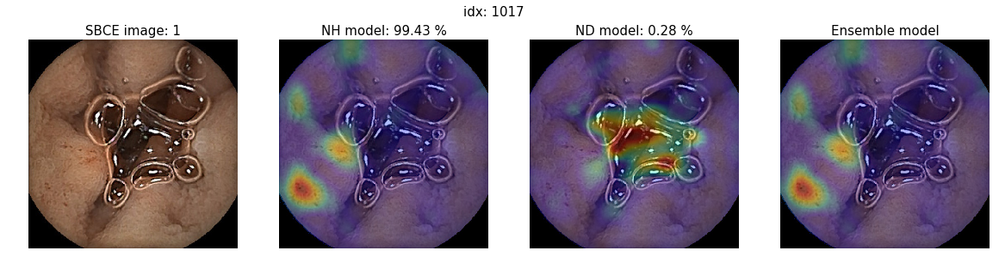

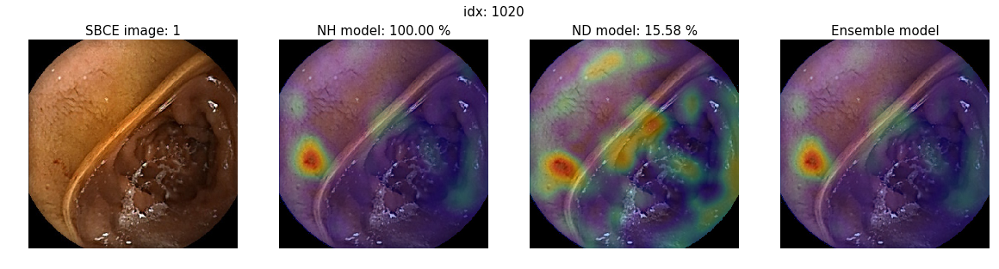

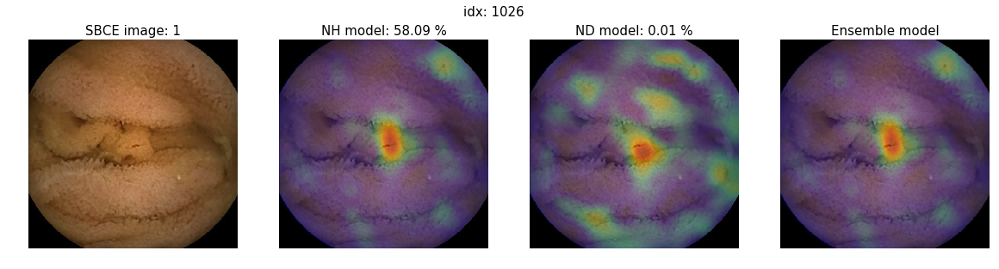

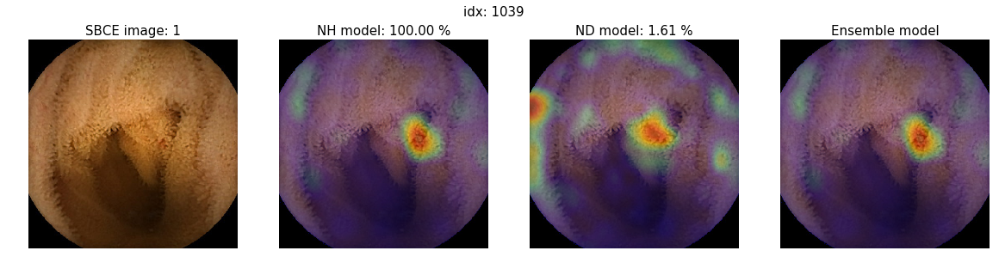

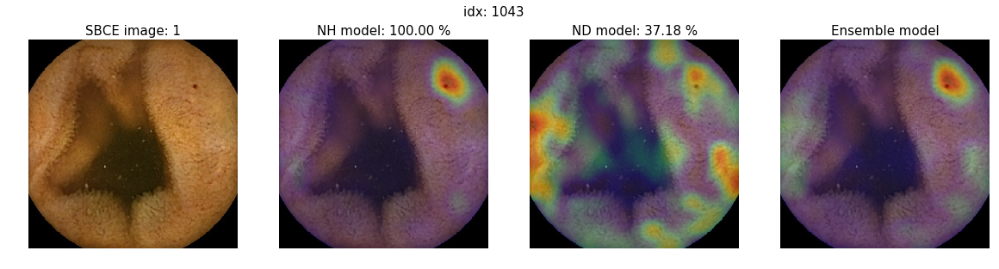

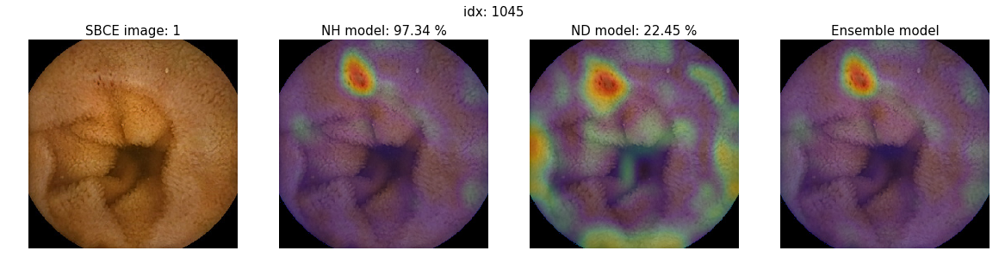

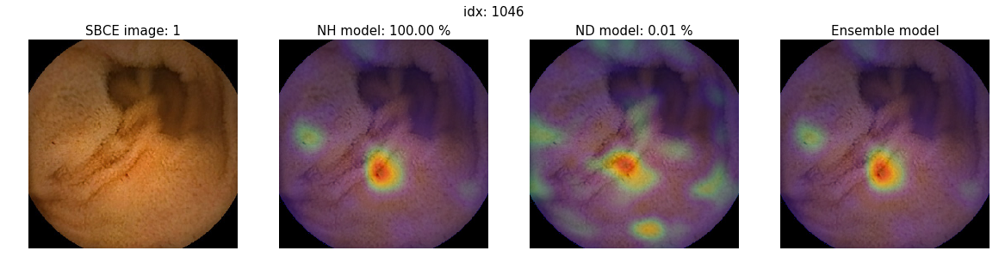

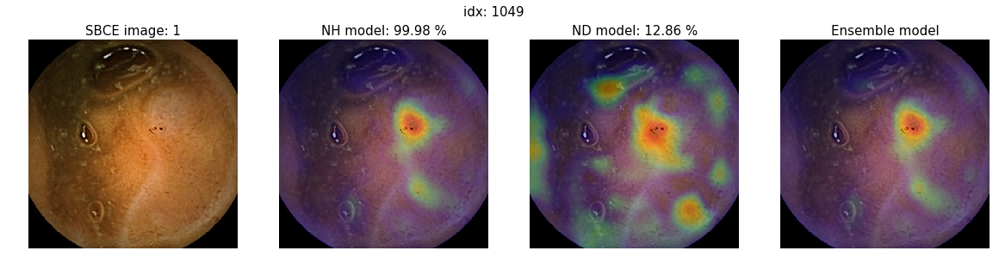

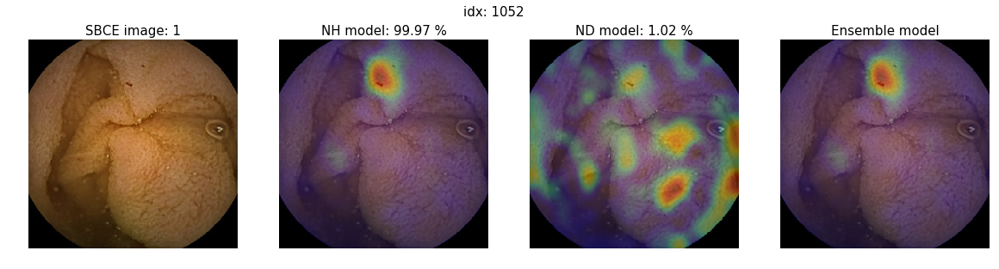

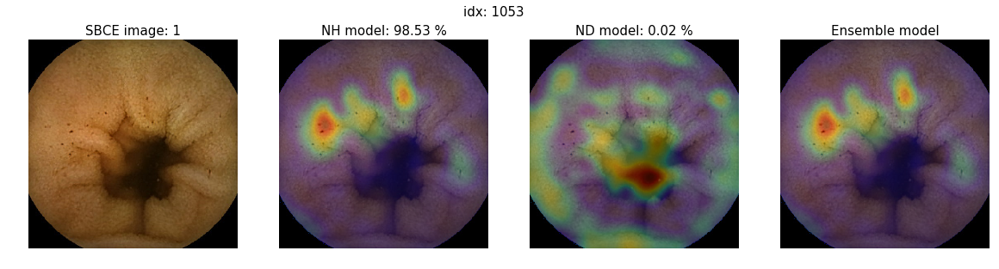

In [101]:
batch_idxs = test_batch_idxs(H_than_D, batch_size = 10)

for i in batch_idxs[-6]:
    n = H_than_D[i]
    plt.figure(figsize = (20, 5))
    plt.suptitle("idx: {}".format(n), y = 0.95, fontsize = 15)
    plt.subplot(141)
    plt.title("SBCE image: {}".format(H_label[n, 1]), fontsize = 15)
    plt.imshow(H_img[n])
    plt.axis('off')
    plt.subplot(142)
    plt.title("NH model: {:.2f} %".format(100*H_nh_output[n, 1]), fontsize = 15)
    plt.imshow(H_img[n])
    plt.imshow(nh_cams[i], cmap = 'jet', alpha = 0.3)
    plt.axis('off')
    plt.subplot(143)
    plt.title("ND model: {:.2f} %".format(100*H_nd_output[n, 1]), fontsize = 15)
    plt.imshow(H_img[n])
    plt.imshow(nd_cams[i], cmap = 'jet', alpha = 0.3)
    plt.axis('off')
    plt.subplot(144)
    plt.title("Ensemble model", fontsize = 15)
    plt.imshow(H_img[n])
    plt.imshow(e_cams[i], cmap = 'jet', alpha = 0.3)
    plt.axis('off')
    plt.show()

In [102]:
H_than_D_select = [1905, 1039, 968, 833, 831, 826, 685, 555, 544, 486, 324, 336]
H_than_D_select = sorted(H_than_D_select)

idx = []
for i in range(len(H_than_D)):
    if H_than_D[i] in H_than_D_select:
        idx.append(i)

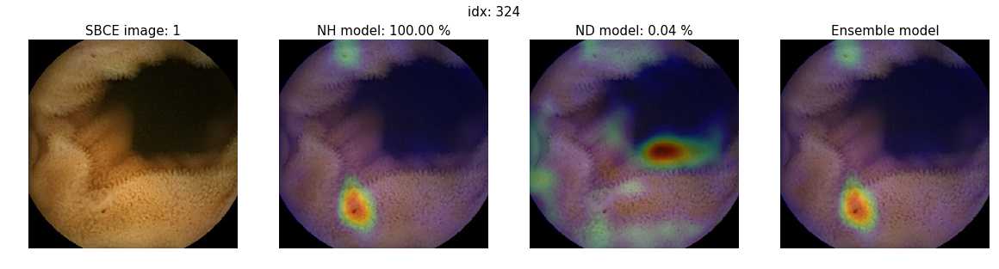

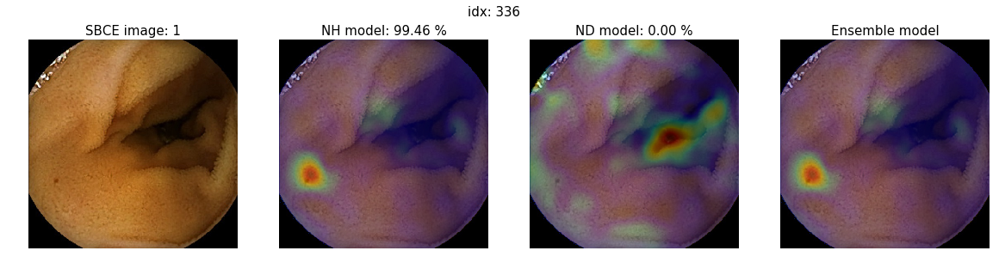

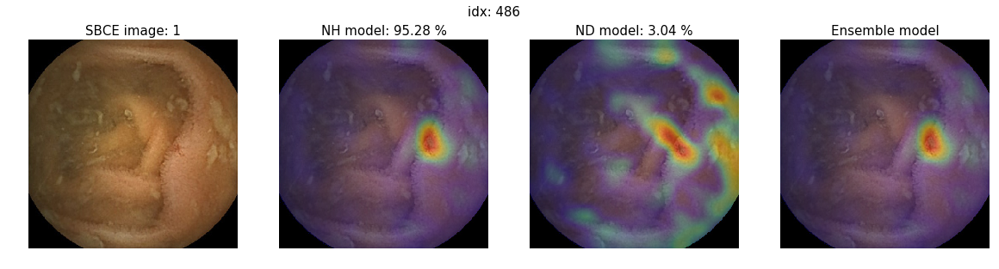

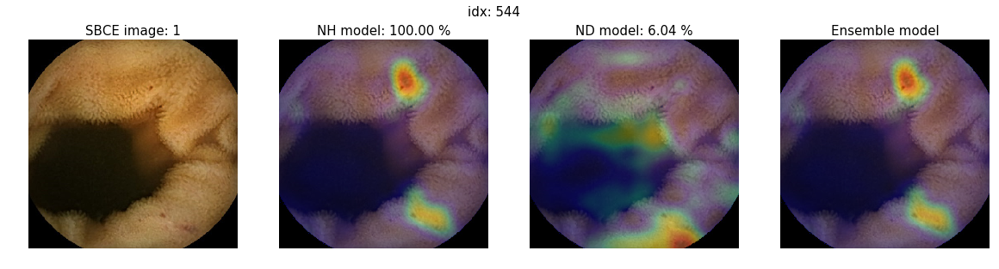

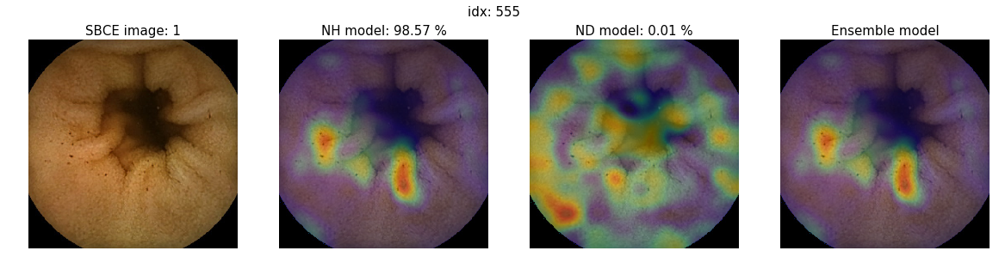

...

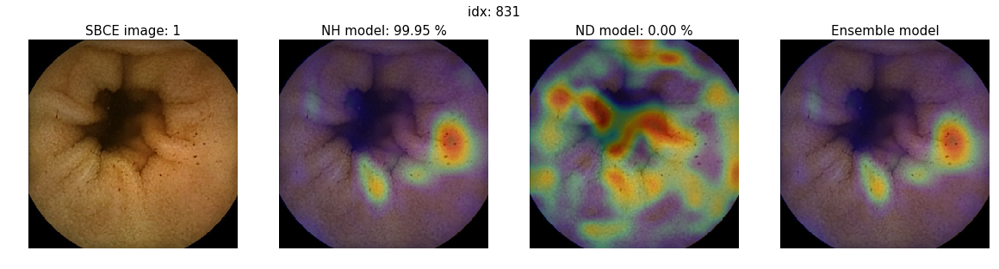

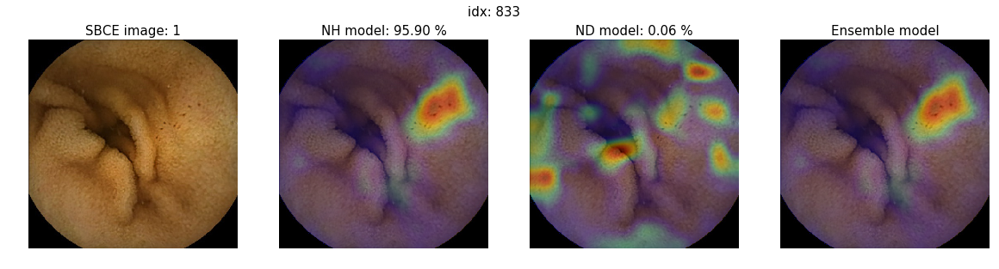

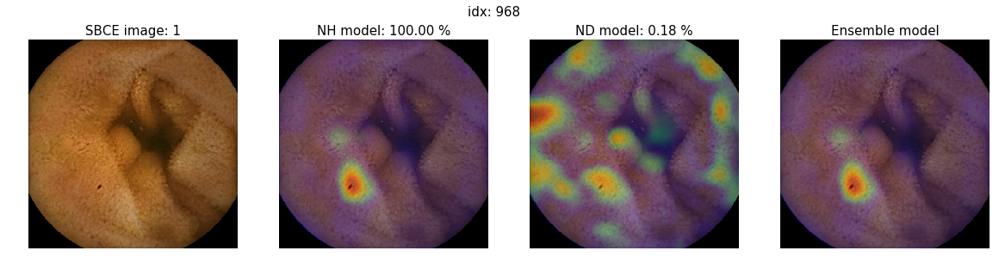

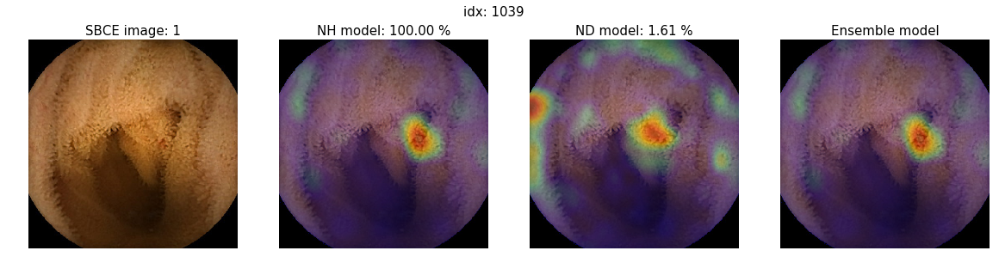

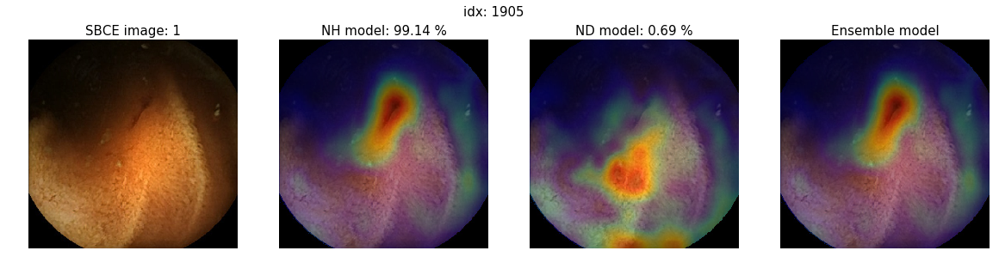

In [106]:
for i, n in zip(idx, H_than_D_select):
    plt.figure(figsize = (20, 5))
    plt.suptitle("idx: {}".format(n), y = 0.95, fontsize = 15)
    plt.subplot(141)
    plt.title("SBCE image: {}".format(H_label[n, 1]), fontsize = 15)
    plt.imshow(H_img[n])
    plt.axis('off')
    plt.subplot(142)
    plt.title("NH model: {:.2f} %".format(100*H_nh_output[n, 1]), fontsize = 15)
    plt.imshow(H_img[n])
    plt.imshow(nh_cams[i], cmap = 'jet', alpha = 0.3)
    plt.axis('off')
    plt.subplot(143)
    plt.title("ND model: {:.2f} %".format(100*H_nd_output[n, 1]), fontsize = 15)
    plt.imshow(H_img[n])
    plt.imshow(nd_cams[i], cmap = 'jet', alpha = 0.3)
    plt.axis('off')
    plt.subplot(144)
    plt.title("Ensemble model", fontsize = 15)
    plt.imshow(H_img[n])
    plt.imshow(e_cams[i], cmap = 'jet', alpha = 0.3)
    plt.axis('off')
    plt.show()

## D prob > 0.5, H prob < 0.5

In [137]:
batch_idxs = test_batch_idxs(D_than_H)

In [138]:
f_n = 'conv2d_11/Relu:0'
nh_cams, nd_cams, e_cams  = [], [], []

for b_idx in batch_idxs:
    nh_cam = NH_model.get_gradcam(D_img[D_than_H[b_idx]], featuremap_name = f_n)
    nd_cam = ND_model.get_gradcam(D_img[D_than_H[b_idx]], featuremap_name = f_n)
    e_cam = E_model.get_gradcam(D_img[D_than_H[b_idx]], featuremap_name = f_n)
    
    nh_cams.append(nh_cam), nd_cams.append(nd_cam), e_cams.append(e_cam)

In [139]:
nh_cams, nd_cams, e_cams = batch_flatten(nh_cams), batch_flatten(nd_cams), batch_flatten(e_cams)

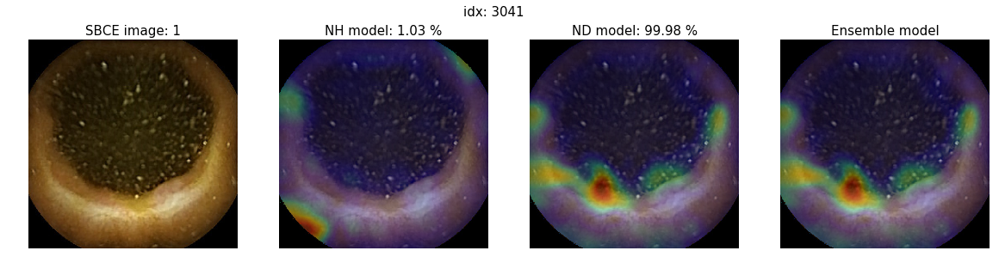

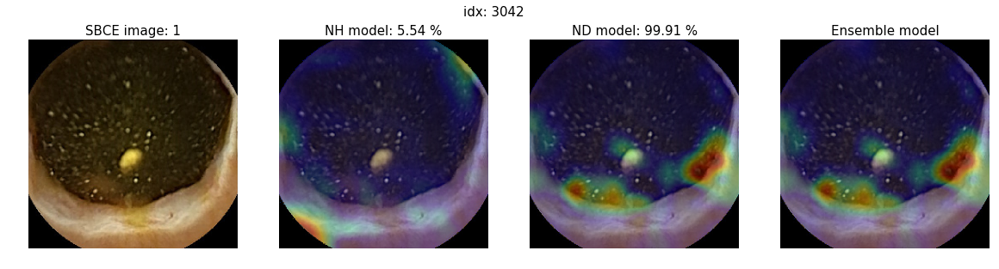

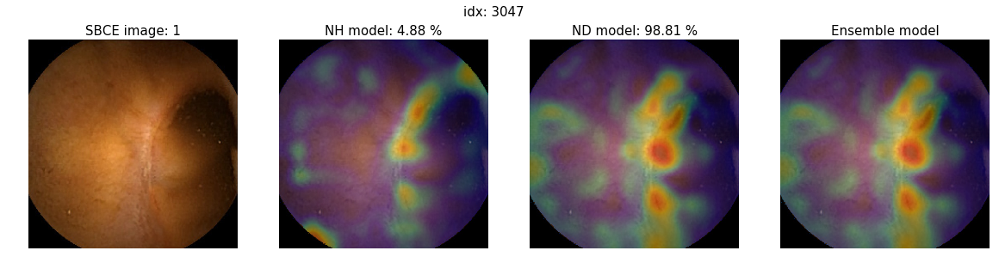

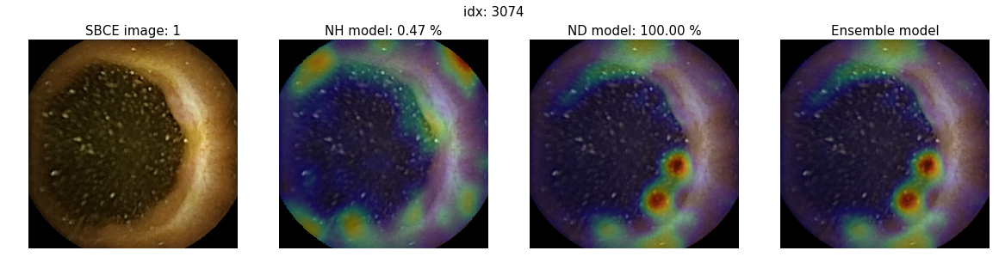

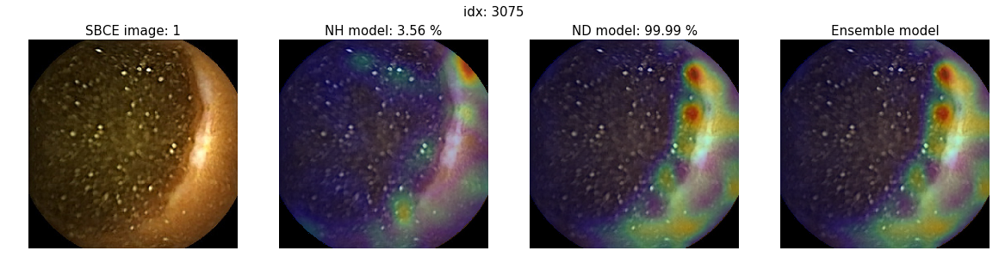

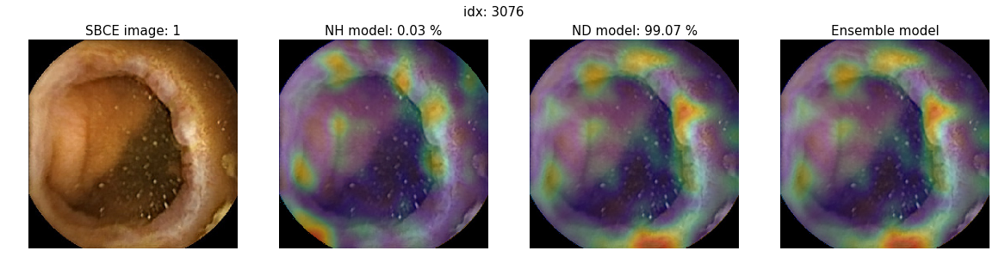

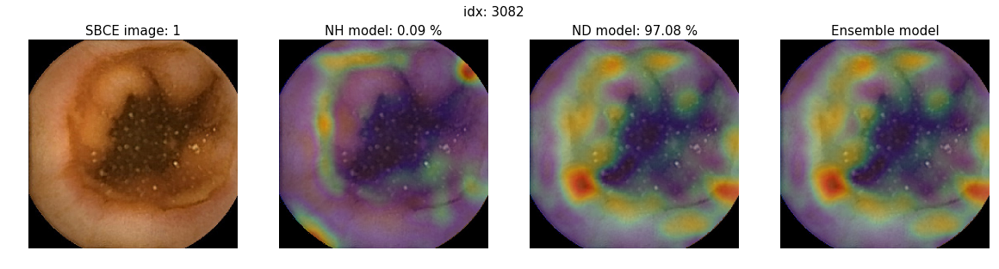

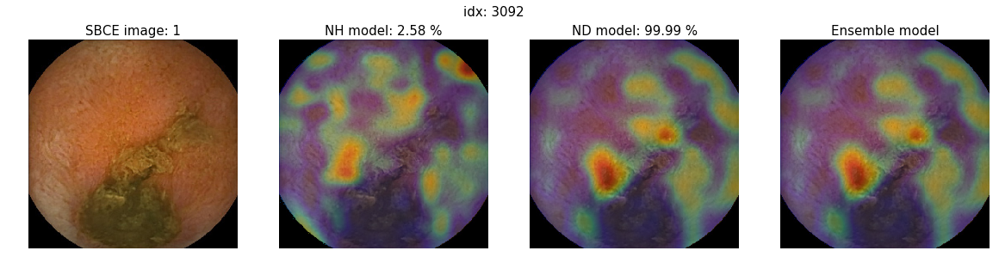

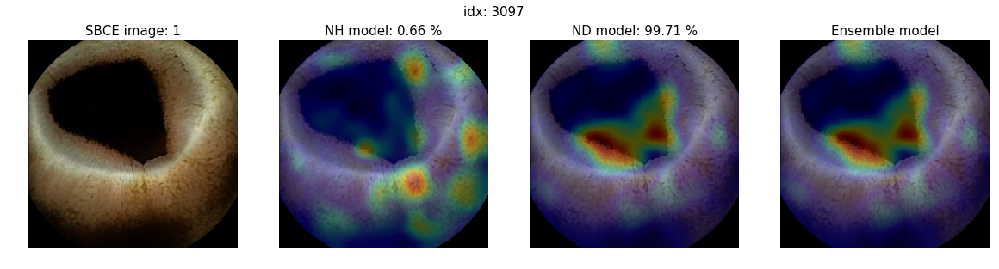

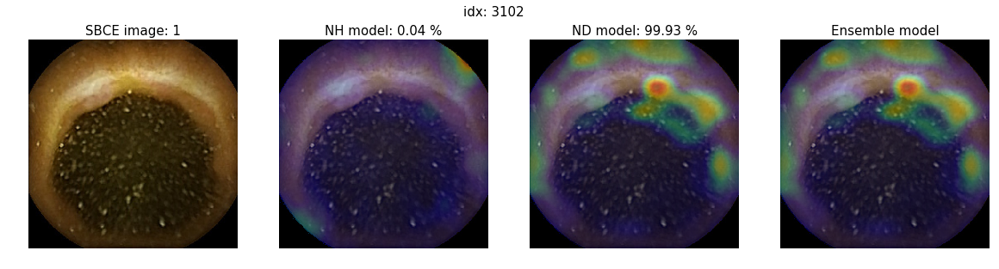

In [164]:
batch_idxs = test_batch_idxs(D_than_H, batch_size = 10)

for i in batch_idxs[34]:
    n = D_than_H[i]
    plt.figure(figsize = (20, 5))
    plt.suptitle("idx: {}".format(n), y = 0.95, fontsize = 15)
    plt.subplot(141)
    plt.title("SBCE image: {}".format(D_label[n, 1]), fontsize = 15)
    plt.imshow(D_img[n])
    plt.axis('off')
    plt.subplot(142)
    plt.title("NH model: {:.2f} %".format(100*D_nh_output[n, 1]), fontsize = 15)
    plt.imshow(D_img[n])
    plt.imshow(nh_cams[i], cmap = 'jet', alpha = 0.3)
    plt.axis('off')
    plt.subplot(143)
    plt.title("ND model: {:.2f} %".format(100*D_nd_output[n, 1]), fontsize = 15)
    plt.imshow(D_img[n])
    plt.imshow(nd_cams[i], cmap = 'jet', alpha = 0.3)
    plt.axis('off')
    plt.subplot(144)
    plt.title("Ensemble model", fontsize = 15)
    plt.imshow(D_img[n])
    plt.imshow(e_cams[i], cmap = 'jet', alpha = 0.3)
    plt.axis('off')
    plt.show()

In [165]:
D_than_H_select = [281, 717, 833, 1200, 1273, 1365, 1390, 1473, 1798, 2181, 2497, 2813, 2860]
D_than_H_select = sorted(D_than_H_select)

idx = []
for i in range(len(D_than_H)):
    if D_than_H[i] in D_than_H_select:
        idx.append(i)

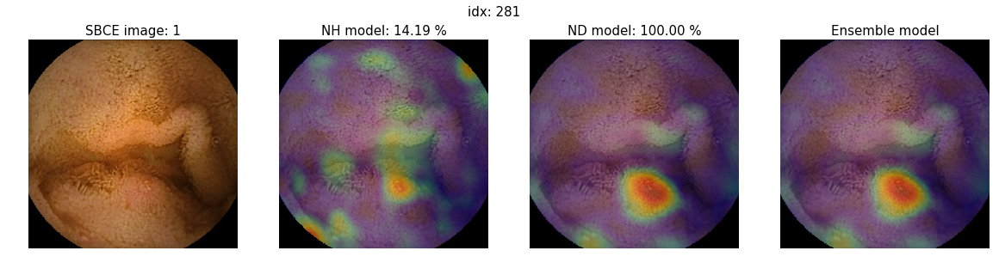

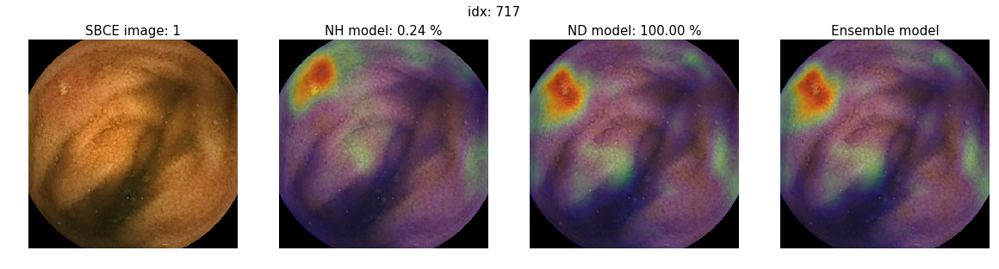

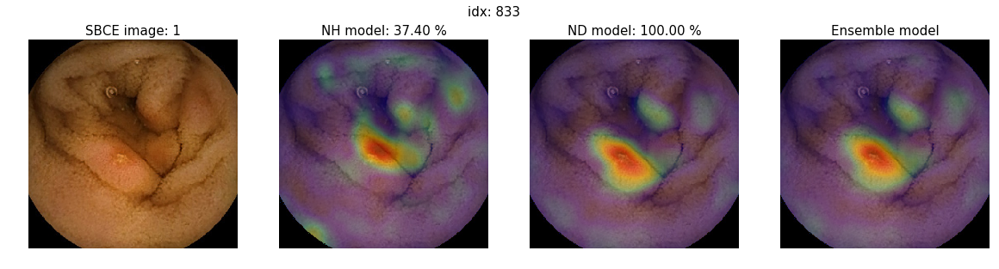

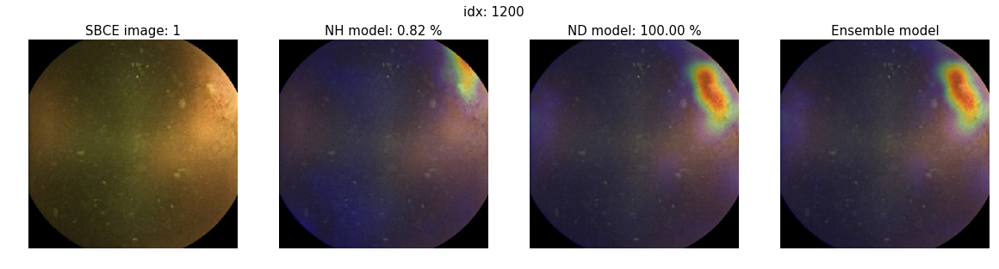

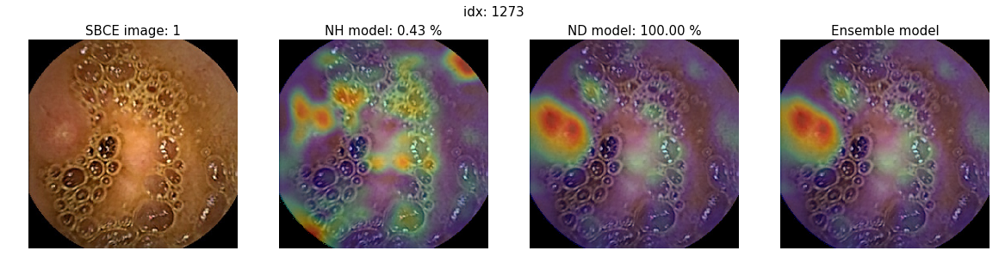

...

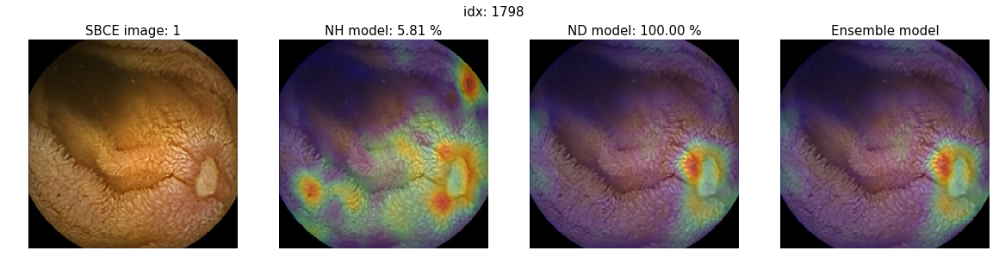

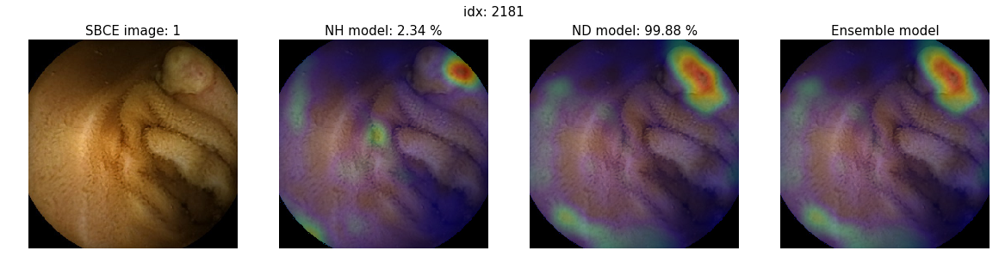

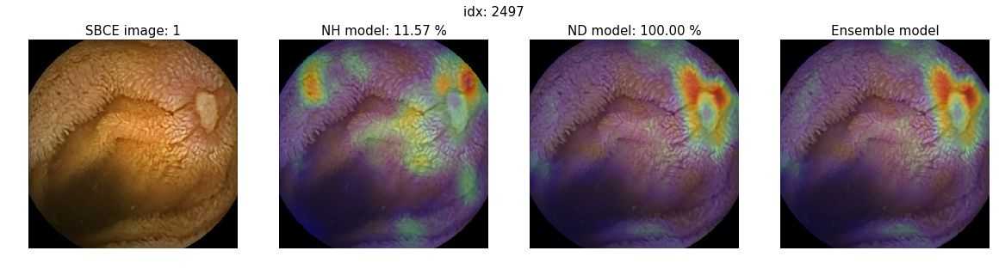

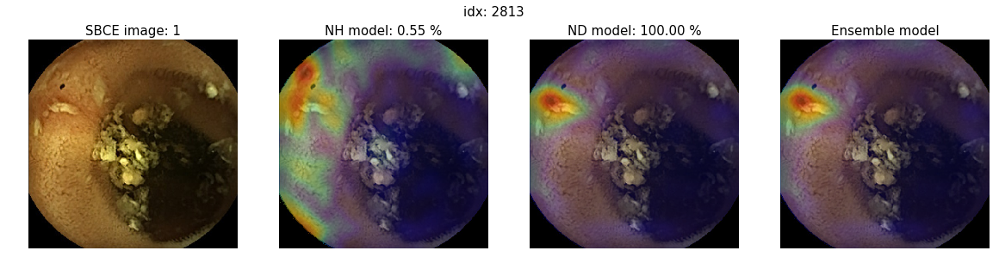

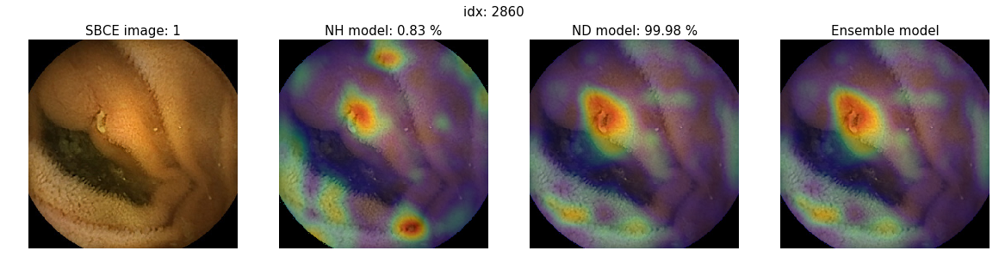

In [167]:
for i, n in zip(idx, D_than_H_select):
    plt.figure(figsize = (20, 5))
    plt.suptitle("idx: {}".format(n), y = 0.95, fontsize = 15)
    plt.subplot(141)
    plt.title("SBCE image: {}".format(D_label[n, 1]), fontsize = 15)
    plt.imshow(D_img[n])
    plt.axis('off')
    plt.subplot(142)
    plt.title("NH model: {:.2f} %".format(100*D_nh_output[n, 1]), fontsize = 15)
    plt.imshow(D_img[n])
    plt.imshow(nh_cams[i], cmap = 'jet', alpha = 0.3)
    plt.axis('off')
    plt.subplot(143)
    plt.title("ND model: {:.2f} %".format(100*D_nd_output[n, 1]), fontsize = 15)
    plt.imshow(D_img[n])
    plt.imshow(nd_cams[i], cmap = 'jet', alpha = 0.3)
    plt.axis('off')
    plt.subplot(144)
    plt.title("Ensemble model", fontsize = 15)
    plt.imshow(D_img[n])
    plt.imshow(e_cams[i], cmap = 'jet', alpha = 0.3)
    plt.axis('off')
    plt.show()